In [2]:
# из библиотеки google.colab импортируем класс files
from google.colab import files

# создаем объект этого класса, применяем метод .upload()
uploaded = files.upload()

Saving VisDrone2019-DET-val.zip to VisDrone2019-DET-val.zip


In [3]:
!unzip "/content/VisDrone2019-DET-val.zip" -d "/content/dataset"

Archive:  /content/VisDrone2019-DET-val.zip
   creating: /content/dataset/VisDrone2019-DET-val/
  inflating: /content/dataset/VisDrone2019-DET-val/.DS_Store  
   creating: /content/dataset/VisDrone2019-DET-val/annotations/
  inflating: /content/dataset/VisDrone2019-DET-val/annotations/0000001_02999_d_0000005.txt  
  inflating: /content/dataset/VisDrone2019-DET-val/annotations/0000001_03499_d_0000006.txt  
  inflating: /content/dataset/VisDrone2019-DET-val/annotations/0000001_03999_d_0000007.txt  
  inflating: /content/dataset/VisDrone2019-DET-val/annotations/0000001_04527_d_0000008.txt  
  inflating: /content/dataset/VisDrone2019-DET-val/annotations/0000001_05249_d_0000009.txt  
  inflating: /content/dataset/VisDrone2019-DET-val/annotations/0000001_05499_d_0000010.txt  
  inflating: /content/dataset/VisDrone2019-DET-val/annotations/0000001_05999_d_0000011.txt  
  inflating: /content/dataset/VisDrone2019-DET-val/annotations/0000001_07999_d_0000012.txt  
  inflating: /content/dataset/Vis

In [4]:
import os
from PIL import Image

# Определение директорий
images_dir = '/content/dataset/VisDrone2019-DET-val/images'
annotations_dir = '/content/dataset/VisDrone2019-DET-val/annotations'
newimages_dir = '/content/newimages'
newannotations_dir = '/content/newannotations'
frames_file = '/content/frames.txt'

# Создание новых директорий, если они не существуют
os.makedirs(newimages_dir, exist_ok=True)
os.makedirs(newannotations_dir, exist_ok=True)

# Чтение frames.txt и обработка каждой строки
with open(frames_file, 'r') as f:
    for line in f:
        parts = [p.strip() for p in line.strip().split(',')]
        if len(parts) >= 5:
            image_name = parts[0]
            try:
                X = int(parts[1])
                Y = int(parts[2])
                width_crop = int(parts[3])
                height_crop = int(parts[4])
            except ValueError:
                print(f"Некорректные координаты в строке frames.txt: {line.strip()}")
                continue

            # Проверка валидности координат обрезки
            if width_crop <= 0 or height_crop <= 0 or X < 0 or Y < 0:
                print(f"Некорректные размеры обрезки для {image_name}: X={X}, Y={Y}, width={width_crop}, height={height_crop}")
                continue

            # Формирование полных путей
            image_path = os.path.join(images_dir, image_name)
            annotation_path = os.path.join(annotations_dir, os.path.splitext(image_name)[0] + '.txt')
            new_image_path = os.path.join(newimages_dir, image_name)
            new_annotation_path = os.path.join(newannotations_dir, os.path.splitext(image_name)[0] + '.txt')

            # Шаг 1: Обрезка изображения
            if os.path.exists(image_path):
                try:
                    img = Image.open(image_path)
                    cropped_img = img.crop((X, Y, X + width_crop, Y + height_crop))
                    cropped_img.save(new_image_path)
                except Exception as e:
                    print(f"Ошибка при обработке изображения {image_path}: {e}")
                    continue
            else:
                print(f"Изображение не найдено: {image_path}")
                continue

            # Шаг 2: Обработка аннотаций
            adjusted_lines = []
            if os.path.exists(annotation_path):
                with open(annotation_path, 'r') as ann_f:
                    for ann_line in ann_f:
                        ann_parts = [p.strip() for p in ann_line.strip().split(',')]
                        if len(ann_parts) >= 6:
                            try:
                                left = int(ann_parts[0])
                                top = int(ann_parts[1])
                                width = int(ann_parts[2])
                                height = int(ann_parts[3])
                                ignored = ann_parts[4]
                                class_label = ann_parts[5]
                                rest = ann_parts[6:] if len(ann_parts) > 6 else []
                            except ValueError:
                                print(f"Некорректная строка аннотации в {annotation_path}: {ann_line.strip()}")
                                continue

                            # Фильтрация по классу 4 (автомобили) и ignored = 0
                            if class_label == '4':
                                # Проверка пересечения с областью обрезки
                                if left >= X and top >= Y and (left + width) <= (X + width_crop) and (top + height) <= (Y + height_crop):
                                    # Пересчет координат относительно обрезанного изображения
                                    new_left = left - X
                                    new_top = top - Y
                                    # Формирование новой строки аннотации
                                    new_ann_parts = [str(new_left), str(new_top), str(width), str(height), ignored, class_label] + rest
                                    adjusted_lines.append(','.join(new_ann_parts) + '\n')

            # Шаг 3: Сохранение аннотаций, если они есть
            if adjusted_lines:
                with open(new_annotation_path, 'w') as new_ann_f:
                    new_ann_f.writelines(adjusted_lines)

print("Обработка завершена.")

Обработка завершена.


Попиксельная точность алгоритма 1 для изображения 1: 0.8943
Попиксельная точность алгоритма 2 для изображения 1: 0.8391


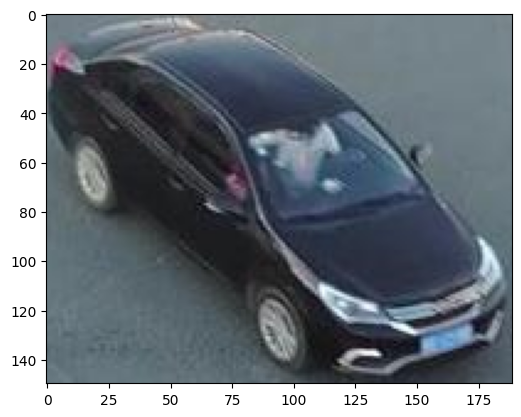

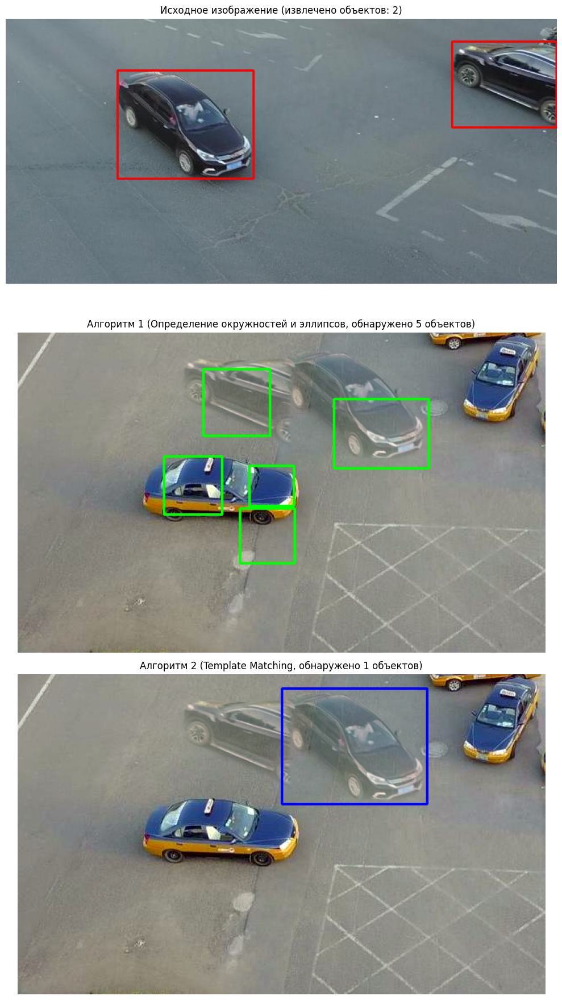

Попиксельная точность алгоритма 1 для изображения 2: 0.8669
Попиксельная точность алгоритма 2 для изображения 2: 0.7851


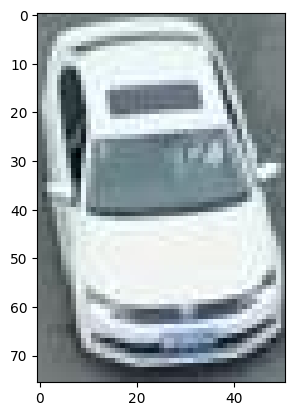

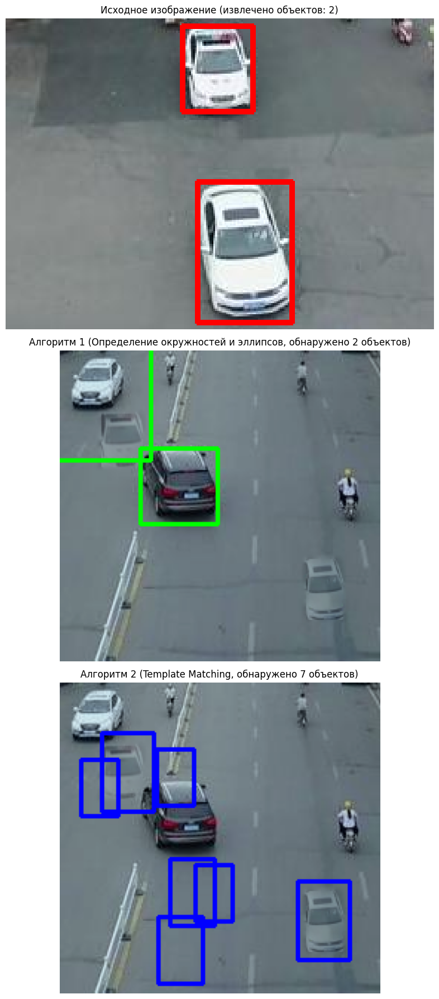

Попиксельная точность алгоритма 1 для изображения 3: 0.7736
Попиксельная точность алгоритма 2 для изображения 3: 0.8138


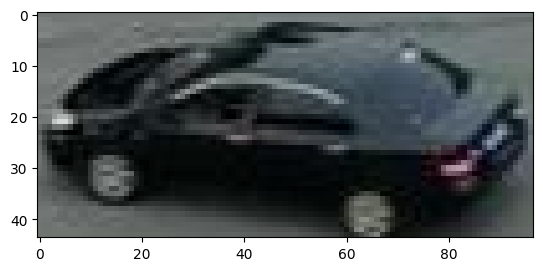

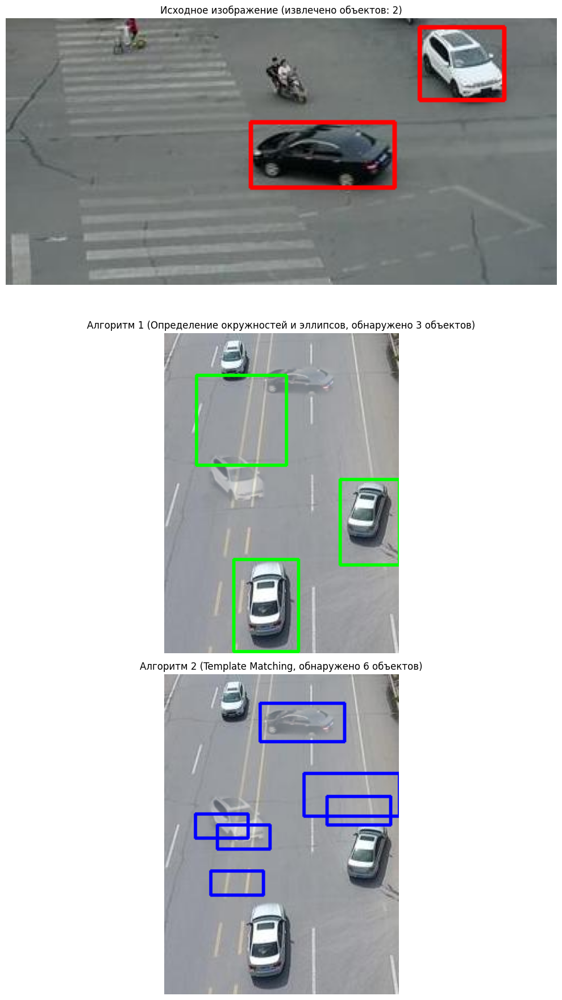

Попиксельная точность алгоритма 1 для изображения 4: 0.6431
Попиксельная точность алгоритма 2 для изображения 4: 0.6559


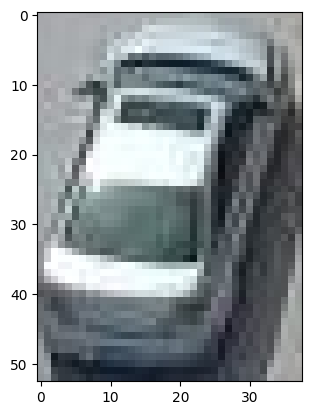

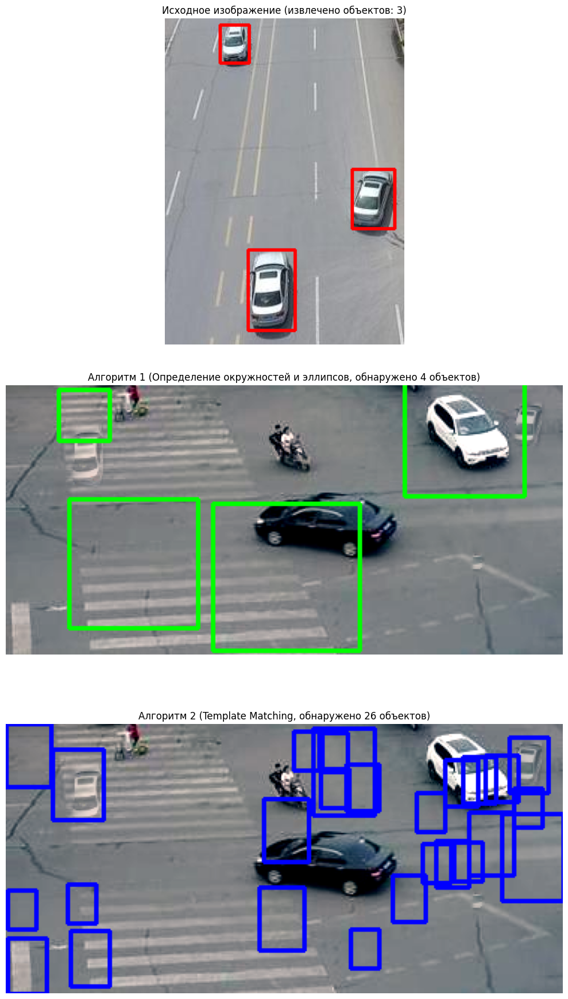

Попиксельная точность алгоритма 1 для изображения 5: 0.8445
Попиксельная точность алгоритма 2 для изображения 5: 0.8848


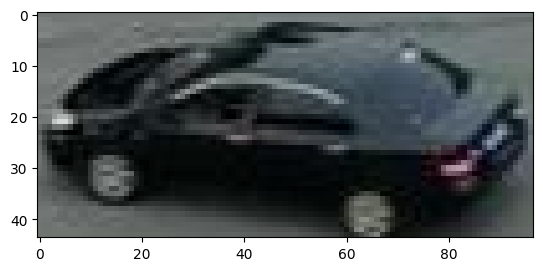

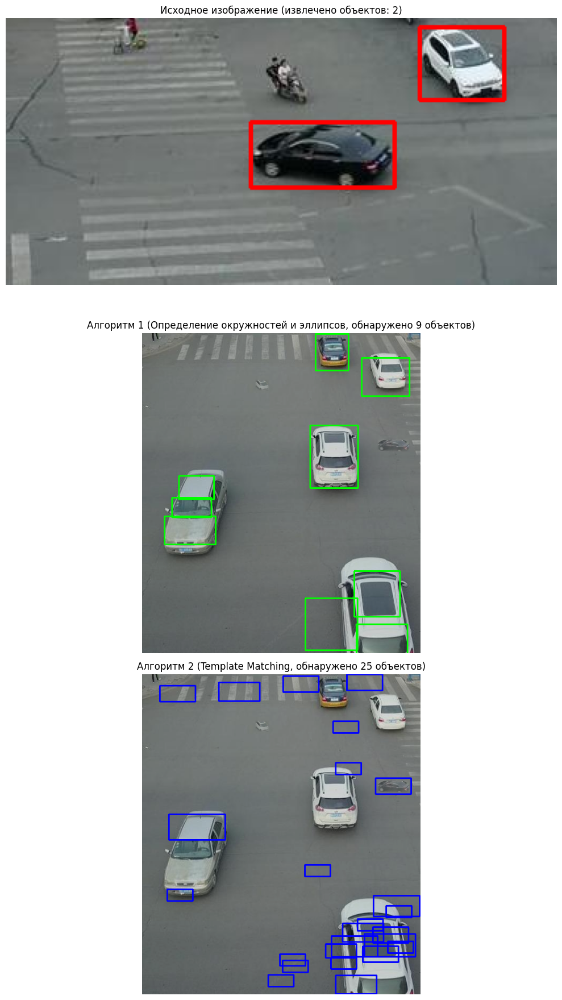

Попиксельная точность алгоритма 1 для изображения 6: 0.8979
Попиксельная точность алгоритма 2 для изображения 6: 0.9119


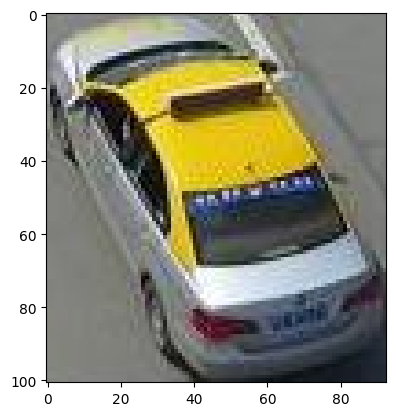

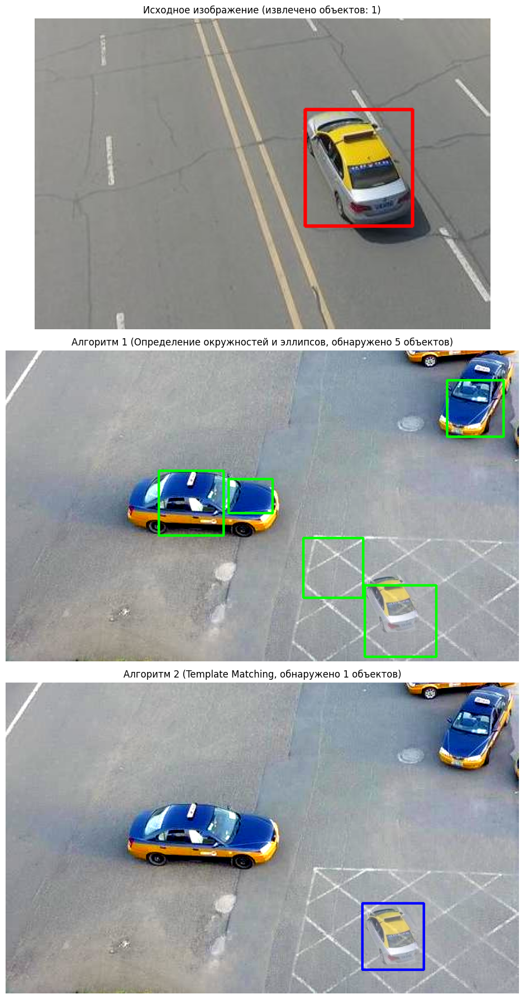

Попиксельная точность алгоритма 1 для изображения 7: 0.7855
Попиксельная точность алгоритма 2 для изображения 7: 0.9376


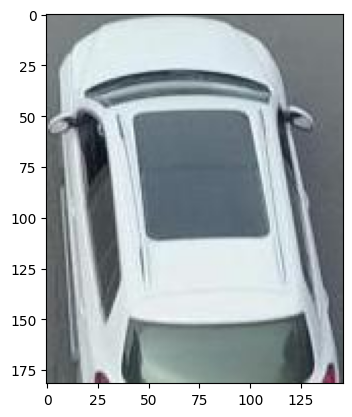

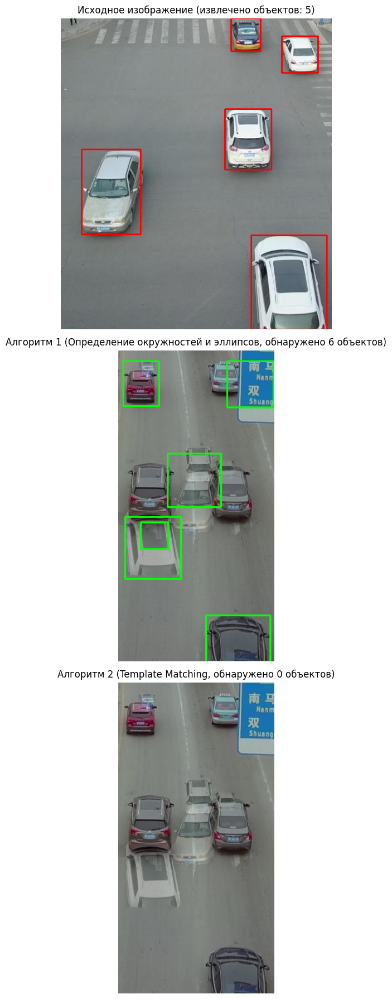

Попиксельная точность алгоритма 1 для изображения 8: 0.6206
Попиксельная точность алгоритма 2 для изображения 8: 0.5708


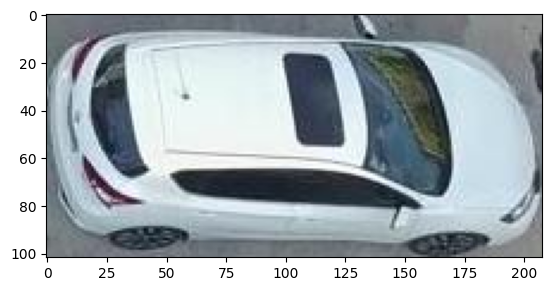

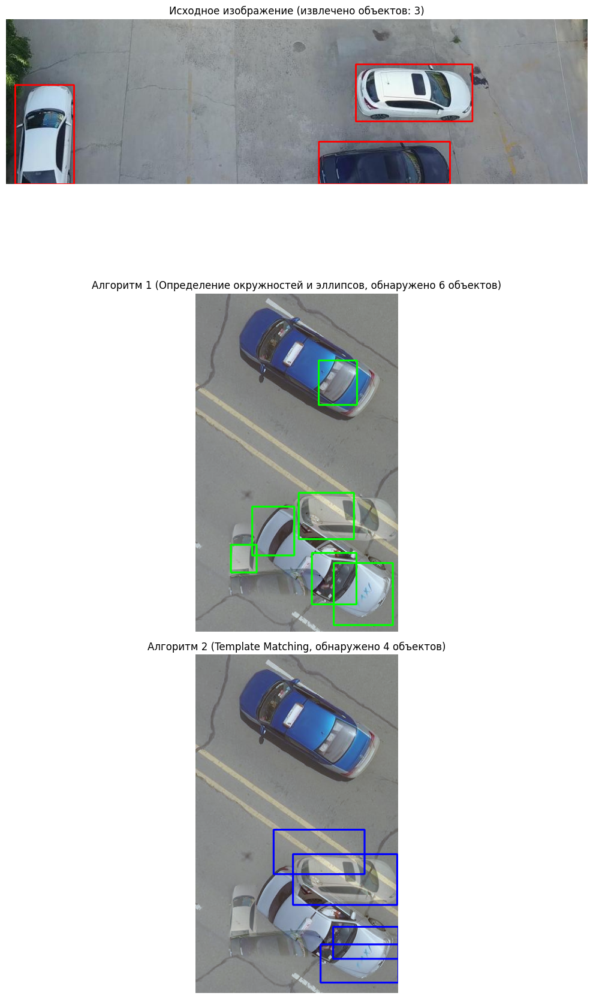

Попиксельная точность алгоритма 1 для изображения 9: 0.8327
Попиксельная точность алгоритма 2 для изображения 9: 0.7886


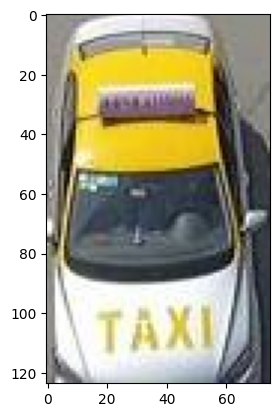

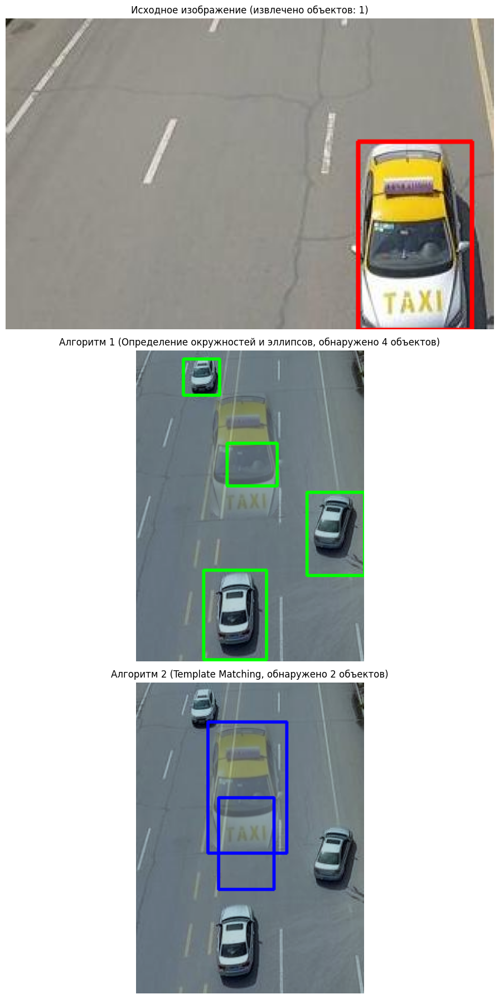

Попиксельная точность алгоритма 1 для изображения 10: 0.7557
Попиксельная точность алгоритма 2 для изображения 10: 0.8821


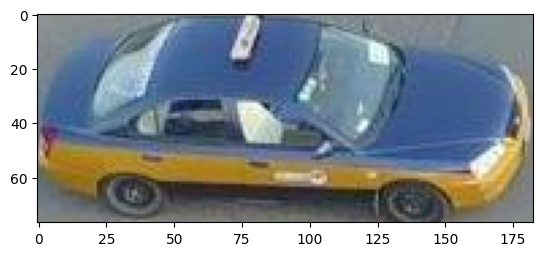

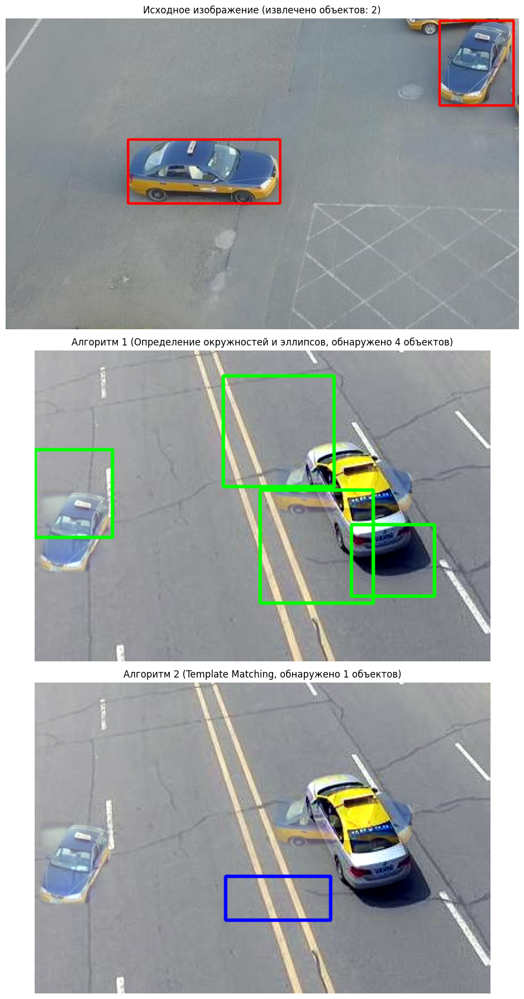

Алгоритм 1 (Объединённая детекция):
  Precision: 0.532, Среднее время: 0.0704 сек
Средняя попиксельная точность сегментации окружностями и эллипсами: 0.7915
Алгоритм 2 (Template Matching):
  Precision: 0.506, Среднее время: 2.6751 сек
Средняя попиксельная точность Template Matching: 0.8070


In [50]:
from __future__ import annotations

import numpy as np
import cv2
import os
import random
import time
import torch
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt

class ChessBoardWildFashionDataset(Dataset):
    def __init__(self, dataset_size: int, visdrone_images_path: str, visdrone_annotations_path: str):
        self.dataset_size = dataset_size
        self.images_path = visdrone_images_path
        self.annotations_path = visdrone_annotations_path
        self.image_files = [f for f in os.listdir(self.images_path) if f.endswith(".jpg")]
        self.annotation_files = [f.replace(".jpg", ".txt") for f in self.image_files]

    def __len__(self):
        return self.dataset_size

    def load_image(self, filename):
        img = cv2.imread(os.path.join(self.images_path, filename))
        if img is None:
            raise FileNotFoundError(f"Не удалось загрузить {filename}")
        return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    def load_annotations(self, filename):
        bboxes = []
        with open(os.path.join(self.annotations_path, filename), 'r') as f:
            for line in f.readlines():
                values = list(map(int, line.strip().split(',')))
                x, y, w, h, _, category = values[:6]
                if category == 4:
                    bboxes.append((x, y, x + w, y + h))
        return bboxes

    def compute_color_statistics(self, image):
        mean, std = cv2.meanStdDev(image)
        return mean.flatten(), std.flatten()

    def apply_color_correction(self, src, ref):
        src_mean, src_std = self.compute_color_statistics(src)
        ref_mean, ref_std = self.compute_color_statistics(ref)
        adjusted = ((src - src_mean) * (ref_std / src_std)) + ref_mean
        return np.clip(adjusted, 0, 255).astype(np.uint8)

    def preprocess_images(self, bg, objects):
        ref_image = self.load_image(random.choice(self.image_files))
        bg = self.apply_color_correction(bg, ref_image)
        objects = [(self.apply_color_correction(obj, ref_image), (x2 - x1, y2 - y1)) for obj, (x1, y1, x2, y2) in objects]
        return bg, objects

    def bbox_area(self, bbox):
        x1, y1, x2, y2 = bbox
        return (x2 - x1) * (y2 - y1)

    def intersection_area(self, box1, box2):
        x1, y1, x2, y2 = box1
        x1_p, y1_p, x2_p, y2_p = box2
        xi1 = max(x1, x1_p)
        yi1 = max(y1, y1_p)
        xi2 = min(x2, x2_p)
        yi2 = min(y2, y2_p)
        return max(0, xi2 - xi1) * max(0, yi2 - yi1)

    def place_objects(self, bg, objects, max_overlap=0.5):
        h, w, _ = bg.shape
        placed_objects = []
        for obj, (ow, oh) in objects:
            scale = random.uniform(0.5, 1.0)
            obj_resized = cv2.resize(obj, (int(ow * scale), int(oh * scale)))
            oh, ow, _ = obj_resized.shape
            placed = False
            for _ in range(10):
                x, y = random.randint(0, w - ow), random.randint(0, h - oh)
                new_bbox = (x, y, x + ow, y + oh)
                if all(self.intersection_area(new_bbox, pb) < max_overlap * self.bbox_area(new_bbox) and
                       self.intersection_area(new_bbox, pb) < max_overlap * self.bbox_area(pb)
                       for pb in placed_objects):
                    mask = 255 * np.ones(obj_resized.shape, obj_resized.dtype)
                    center = (x + ow // 2, y + oh // 2)
                    try:
                        bg = cv2.seamlessClone(obj_resized, bg, mask, center, cv2.MIXED_CLONE_WIDE)
                        placed_objects.append(new_bbox)
                        placed = True
                        break
                    except cv2.error as e:
                        print(f"Ошибка при вставке объекта: {e}")
            if not placed:
                print("Не удалось разместить объект без превышения 50% перекрытия.")
        return bg, placed_objects

    def __getitem__(self, idx):
        while True:
            patch_source_file = random.choice(self.image_files)
            annotation_file = patch_source_file.replace(".jpg", ".txt")
            bboxes = self.load_annotations(annotation_file)
            if len(bboxes) > 0:
                break
        while True:
            bg_file = random.choice(self.image_files)
            if bg_file != patch_source_file:
                break

        patch_source = self.load_image(patch_source_file)
        background = self.load_image(bg_file)

        bg_annotation_file = os.path.join(self.annotations_path, bg_file.replace(".jpg", ".txt"))
        if os.path.exists(bg_annotation_file):
            bg_bboxes = self.load_annotations(bg_annotation_file)
        else:
            bg_bboxes = []

        objects = [(patch_source[y1:y2, x1:x2], (x1, y1, x2, y2)) for x1, y1, x2, y2 in bboxes]
        background, objects = self.preprocess_images(background, objects)
        final_image, new_bboxes = self.place_objects(background, objects)

        total_bboxes = bg_bboxes + new_bboxes

        return (torch.FloatTensor(patch_source),
                torch.tensor(bboxes, dtype=torch.int32),
                torch.FloatTensor(final_image),
                total_bboxes,
                len(bboxes))

def segmentation_hough_circles(image, dp=1.5, minDist=100, param1=100, param2=30, minRadius=10, maxRadius=50, cannyThreshold = 100):
    # Последовательность фильтров и их параметры были подобраны опытным путем. Качественная сегментация на всех изображениях из генератора не гарантируется
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    src_blur = cv2.bilateralFilter(gray, d=9, sigmaColor=10, sigmaSpace=75)

    canny_output = cv2.Canny(src_blur, int(1 * cannyThreshold), int(cannyThreshold * 2))

    kernel = np.ones((3, 3), np.uint8)
    closing = cv2.morphologyEx(canny_output, cv2.MORPH_CLOSE, kernel)

    circles = cv2.HoughCircles(closing, cv2.HOUGH_GRADIENT, dp, minDist=minDist,
                               param1=param1, param2=param2,
                               minRadius=minRadius, maxRadius=maxRadius)
    bboxes = []
    if circles is not None:
        circles = np.int32(np.around(circles))
        for i in circles[0, :]:
            x, y, r = i
            bbox = (max(x - r, 0), max(y - r, 0), x + r, y + r)
            bboxes.append(bbox)
    return bboxes

def segmentation_ellipses(image, min_contour_points = 5, min_area = 100, cannyPorog = 50):
    # Последовательность фильтров и их параметры были подобраны опытным путем. Качественная сегментация на всех изображениях из генератора не гарантируется
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    src_blur = cv2.bilateralFilter(gray, d=9, sigmaColor=10, sigmaSpace=75)

    edges = cv2.Canny(src_blur, int(1*cannyPorog), cannyPorog * 2)

    kernel = np.ones((3, 3), np.uint8)
    closing = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)

    contours, _ = cv2.findContours(closing, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    minRect = [None]*len(contours)
    minEllipse = [None]*len(contours)
    for i, c in enumerate(contours):
        minRect[i] = cv2.minAreaRect(c)
        if c.shape[0] > 5:
            minEllipse[i] = cv2.fitEllipse(c)

    bboxes = []
    for i, c in enumerate(contours):
        area = cv2.contourArea(c)

        if area < 1000 or area > 15000:
            continue

        # Периметр контура
        perimeter = cv2.arcLength(c, True)
        if perimeter == 0:
            continue

        '''# Вычисляем меру округлости (circularity)
        circularity = 4 * np.pi * area / (perimeter * perimeter)
        if circularity > 0.9:
            continue'''

        rect = cv2.minAreaRect(c)
        width, height = rect[1]
        aspect_ratio = max(width, height) / min(width, height)
        if aspect_ratio > 4.0:
            continue

        box = cv2.boxPoints(minRect[i])
        box = np.int32(box)
        x, y, w, h = cv2.boundingRect(box)
        bboxes.append((x, y, x + w, y + h))
    return bboxes

def segmentation_template_matching(image, template, thresh=0.90):
    gray_img = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    gray_template = cv2.cvtColor(template, cv2.COLOR_RGB2GRAY)
    #edges_template = cv2.Canny(gray_template, 50, 150)

    tH_orig, tW_orig = gray_template.shape[:2]
    detected_bboxes = []
    scales = np.arange(0.5, 1.2, 0.1)
    angles = np.arange(-180, 181, 5)

    for scale in scales:
        for angle in angles:
            tW = int(tW_orig * scale)
            tH = int(tH_orig * scale)
            if tW < 10 or tH < 10:
                continue
            resized = cv2.resize(gray_template, (tW, tH))
            center = (tW // 2, tH // 2)
            M = cv2.getRotationMatrix2D(center, angle, 1.0)
            rotated = cv2.warpAffine(resized, M, (tW, tH))
            if rotated.shape[0] < 10 or rotated.shape[1] < 10:
                continue
            #gray_rotated = cv2.cvtColor(rotated, cv2.COLOR_BGR2GRAY)
            #_, mask = cv2.threshold(rotated, 1, 255, cv2.THRESH_BINARY)

            result = cv2.matchTemplate(gray_img, rotated, cv2.TM_CCOEFF_NORMED)
            (minVal, maxVal, minLoc, maxLoc) = cv2.minMaxLoc(result)
            if maxVal >= thresh:
                top_left = maxLoc
                bottom_right = (top_left[0] + tW, top_left[1] + tH)
                detected_bboxes.append((top_left[0], top_left[1], bottom_right[0], bottom_right[1]))

    final_boxes = []
    detected_bboxes = sorted(detected_bboxes, key=lambda b: b[0])
    for box in detected_bboxes:
        keep = True
        for fb in final_boxes:
            xi1 = max(box[0], fb[0])
            yi1 = max(box[1], fb[1])
            xi2 = min(box[2], fb[2])
            yi2 = min(box[3], fb[3])
            inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
            area_box = (box[2]-box[0])*(box[3]-box[1])
            area_fb = (fb[2]-fb[0])*(fb[3]-fb[1])
            union_area = area_box + area_fb - inter_area
            iou = inter_area/union_area if union_area > 0 else 0
            if iou > 0.3:
                keep = False
                break
        if keep:
            final_boxes.append(box)

    return final_boxes

def compute_metrics(detected_counts, ground_truth_counts):
    num_images = len(ground_truth_counts)
    precisions = []
    for det, gt in zip(detected_counts, ground_truth_counts):
        TP = min(det, gt)
        FP = max(0, det - gt)
        prec = TP / (TP + FP) if (TP + FP) > 0 else 0
        precisions.append(prec)
    avg_precision = np.mean(precisions)
    return avg_precision

def filter_bboxes(bboxes, min_area=1000, max_area=15000, aspect_ratio_range=(0.5, 2.0)):
    filtered = []
    for box in bboxes:
        x1, y1, x2, y2 = box
        w, h = x2 - x1, y2 - y1
        area = w * h
        if area < min_area or area > max_area:
            continue

        aspect_ratio = w / h if h > 0 else 0
        if aspect_ratio < aspect_ratio_range[0] or aspect_ratio > aspect_ratio_range[1]:
            continue

        filtered.append(box)
    return filtered

def bboxes_to_mask(bboxes, image_shape):
    mask = np.zeros(image_shape, dtype=np.uint8)
    for x1, y1, x2, y2 in bboxes:
        cv2.rectangle(mask, (x1, y1), (x2, y2), color=1, thickness=-1)
    return mask

def compute_pixel_accuracy(pred_mask, gt_mask):
    pred = pred_mask.astype(bool)
    gt   = gt_mask.astype(bool)

    TP = np.logical_and(pred, gt).sum()
    TN = np.logical_and(~pred, ~gt).sum()
    FP = np.logical_and(pred, ~gt).sum()
    FN = np.logical_and(~pred, gt).sum()

    total = TP + TN + FP + FN
    return (TP + TN) / total if total > 0 else 0.0

if __name__ == "__main__":
    test_dataset_size = 10
    dataset = ChessBoardWildFashionDataset(
        dataset_size=test_dataset_size,
        visdrone_images_path="/content/newimages",
        visdrone_annotations_path="/content/newannotations"
    )
    dataloader = DataLoader(dataset, batch_size=1, shuffle=True)

    gt_counts = []
    detected_counts_combined = []
    detected_counts_template = []
    times_combined = []
    times_template = []
    pixel_accuracies_combined = []
    pixel_accuracies_template = []

    for i, (patch_img_tensor, bboxes, final_img_tensor, total_bboxes, num_objects) in enumerate(dataloader):
        patch_img = patch_img_tensor[0].numpy().astype(np.uint8)
        final_img = final_img_tensor[0].numpy().astype(np.uint8)
        gt_count = num_objects.item()
        gt_counts.append(gt_count)

        patch_img_disp = patch_img.copy()
        numpbboxes = bboxes[0].numpy()
        x1, y1, x2, y2 = numpbboxes[0]
        template_patch = patch_img_disp[y1:y2, x1:x2]
        plt.imshow(template_patch)

        for x1, y1, x2, y2 in numpbboxes:
            template_patch2 = patch_img_disp[y1:y2, x1:x2]
            cv2.rectangle(patch_img_disp, (x1, y1), (x2, y2), (255, 0, 0), 2)

        start_time = time.time()
        boxes_circles = segmentation_hough_circles(final_img, dp=1.5, minDist=100, param1=100, param2=30, minRadius=10, maxRadius=50)
        boxes_ellipses = segmentation_ellipses(final_img)
        combined_boxes = boxes_circles + boxes_ellipses

        #detected_combined = combined_boxes
        detected_combined = []
        for box in sorted(combined_boxes, key=lambda b: b[0]):
            keep = True
            for fb in detected_combined:
                xi1 = max(box[0], fb[0])
                yi1 = max(box[1], fb[1])
                xi2 = min(box[2], fb[2])
                yi2 = min(box[3], fb[3])
                inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
                area_box = (box[2]-box[0])*(box[3]-box[1])
                area_fb = (fb[2]-fb[0])*(fb[3]-fb[1])
                union_area = area_box + area_fb - inter_area
                iou = inter_area/union_area if union_area > 0 else 0
                if iou > 0.3:
                    keep = False
                    break
            if keep:
                detected_combined.append(box)

        detected_combined = filter_bboxes(detected_combined)
        end_time = time.time()
        times_combined.append(end_time - start_time)
        detected_counts_combined.append(len(detected_combined))

        h, w, _ = final_img.shape
        total_bboxes = total_bboxes[0]
        total_bboxes2 = [tuple(box.item() for box in total_bboxes)]


        gt_mask = bboxes_to_mask(total_bboxes2, (h, w))
        pred_mask_c = bboxes_to_mask(detected_combined, (h, w))
        pix_acc_c = compute_pixel_accuracy(pred_mask_c, gt_mask)
        pixel_accuracies_combined.append(pix_acc_c)
        print(f"Попиксельная точность алгоритма 1 для изображения {i+1}: {pix_acc_c:.4f}")

        final_img_combined = final_img.copy()
        for x1, y1, x2, y2 in detected_combined:
            cv2.rectangle(final_img_combined, (x1, y1), (x2, y2), (0, 255, 0), 2)

        start_time = time.time()
        detected_template = segmentation_template_matching(final_img, template_patch, thresh=0.55)
        end_time = time.time()
        times_template.append(end_time - start_time)
        detected_counts_template.append(len(detected_template))

        pred_mask_t = bboxes_to_mask(detected_template, (h, w))
        pix_acc_t = compute_pixel_accuracy(pred_mask_t, gt_mask)
        pixel_accuracies_template.append(pix_acc_t)
        print(f"Попиксельная точность алгоритма 2 для изображения {i+1}: {pix_acc_t:.4f}")

        final_img_template = final_img.copy()
        for x1, y1, x2, y2 in detected_template:
            cv2.rectangle(final_img_template, (x1, y1), (x2, y2), (0, 0, 255), 2)

        plt.figure(figsize=(10, 18))
        plt.subplot(3, 1, 1)
        plt.imshow(patch_img_disp)
        plt.title(f'Исходное изображение (извлечено объектов: {gt_count})')
        plt.axis('off')

        plt.subplot(3, 1, 2)
        plt.imshow(final_img_combined)
        plt.title(f'Алгоритм 1 (Определение окружностей и эллипсов, обнаружено {len(detected_combined)} объектов)')
        plt.axis('off')

        plt.subplot(3, 1, 3)
        plt.imshow(final_img_template)
        plt.title(f'Алгоритм 2 (Template Matching, обнаружено {len(detected_template)} объектов)')
        plt.axis('off')

        plt.tight_layout()
        plt.show()

    prec_combined = compute_metrics(detected_counts_combined, gt_counts)
    prec_template = compute_metrics(detected_counts_template, gt_counts)

    print("Алгоритм 1 (Объединённая детекция):")
    print(f"  Precision: {prec_combined:.3f}, Среднее время: {np.mean(times_combined):.4f} сек")
    print(f"Средняя попиксельная точность сегментации окружностями и эллипсами: {np.mean(pixel_accuracies_combined):.4f}")
    print("Алгоритм 2 (Template Matching):")
    print(f"  Precision: {prec_template:.3f}, Среднее время: {np.mean(times_template):.4f} сек")
    print(f"Средняя попиксельная точность Template Matching: {np.mean(pixel_accuracies_template):.4f}")